In [1]:
using Distributions
using StatsPlots
default(fmt=:png, tickfontsize=6, titlefontsize=12)

ECDF(A, x) = count(≤(x), A)/length(A)

function degree_of_freedom_Welchelch(m, sx², n, sy²)
    (sx²/m + sy²/n)^2 / ((sx²/m)^2/(m-1) + (sy²/n)^2/(n-1))
end

function plot_t_tests(;
        distx = Normal(),
        disty = Normal(),
        m = 10, 
        n = 10,
        s = 1,
        L = 10^6,
        ytick = 0:0.01:1,
        ylim = :auto,
        legend = :bottom,
        bin = :auto
    )
    println("(distribution of X) = distx = ", distx) 
    println("(distribution of Y) = disty = ", disty)
    println("(size of sample from X) = m = ", m)
    println("(size of sample from Y) = n = ", n)
    if s != 1 println("multiple of disty = ", s) end
    println()
    
    @show mean(distx)
    if s == 1 @show(mean(disty)) else @show(s*mean(disty)) end
    @show std(distx)
    if s == 1 @show(std(disty)) else @show(abs(s)*std(disty)) end
    println()
    
    X = rand(distx, m, L)
    Y = rand(disty, n, L)
    
    X̄ = mean(X; dims=1) |> vec
    Ȳ = s*mean(Y; dims=1) |> vec
    SX = std.(eachcol(X))
    SY = std.(eachcol(Y));
    S = @. √(((m-1)*SX^2 + (n-1)*SY^2)/(m+n-2))

    T_Student = @. (X̄ - Ȳ)/(S*√(1/m + 1/n))
    T_Welch = @. (X̄ - Ȳ)/√(SX^2/m + SY^2/n)
    @show T_Student ≈ T_Welch
    println()
    
    df_Student = m + n - 2
    DF_Welch = @. degree_of_freedom_Welchelch(m, SX^2, n, SY^2)
    @show df_Student
    @show mean(DF_Welch) std(DF_Welch)
    println()

    pval_Student = @. 2ccdf(TDist(m+n-2), abs(T_Student))
    pval_Welch = @. 2ccdf(TDist(DF_Welch), abs(T_Welch))

    @show ECDF(pval_Student, 0.05) ECDF(pval_Welch, 0.05)
    println()
    @show ECDF(pval_Student, 0.01) ECDF(pval_Welch, 0.01)
    println()
    
    P = plot(α -> ECDF(pval_Student, α), 0, 0.1; label="Student t-test")
    plot!(α -> ECDF(pval_Welch, α), 0, 0.1; label="Welch t-test", ls=:dash)
    plot!(identity, 0, 0.1; label="", ls=:dot, c=:black)
    plot!(; xtick=0:0.01:1, ytick, xrotation=90)
    plot!(; xguide="nominal significance level α",
        yguide="probability of p-value ≤ α")
    plot!(; legend=:outertop, legendfontsize=10)

    Q = stephist(pval_Student; norm=true, bin, label="Student t-test")
    stephist!(pval_Welch; norm=true, bin, ls=:dash, label="Welch t-test")
    plot!(; xguide="P-value", yguide="probability density")
    plot!(; xtick=0:0.05:1, ytick=0:0.1:5, xrotation=90)
    plot!(; legend=:outertop, legendfontsize=10, ylim)
    
    plot(P, Q; size=(1000, 460), layout=@layout [a{0.4w} b])
    plot!(; bottommargin=4Plots.mm, leftmargin=4Plots.mm)
end

function plot_df_and_tstatratio(;
        m = 9,
        n = 11,
        tick = Any[0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100]
    )
    log10tick = (tick, string.(tick))
    as = 10.0 .^ range(log10(minimum(tick)), log10(maximum(tick)), 1000)

    P = plot(as, a -> degree_of_freedom_Welchelch(m, 1, n, a^2); label="Welch t-test")
    hline!([(m-1)+(n-1)]; label="Student t-test", ls=:dash)
    hline!([min(m-1, n-1)]; label="min(m-1, n-1)", ls=:dashdot)
    hline!([max(m-1, n-1)]; label="max(m-1, n-1)", ls=:dashdotdot)
    vline!([√((n*(n-1))/(m*(m-1)))]; label="√((n*(n-1))/(m*(m-1)))", ls=:dot)
    vline!([1]; label="", ls=:dot, c=:gray)
    plot!(xscale=:log10, xtick=log10tick)
    plot!(xguide="std(sample of Y) / std(sample of X)")
    title!("degree of freedom for m = $m, n = $n")

    Q = plot(as, a -> √(1/m + a^2/n) / √((((m-1)+(n-1)*a^2)/(m-1+n-1))*(1/m+1/n));
        label="t_Student / t_Welch")
    hline!([√(m/n), √(n/m)]; label="√(m/n), √(n/m)", ls=:dash)
    vline!([1]; label="", ls=:dot, c=:gray)
    plot!(xscale=:log10, xtick=log10tick)
    plot!(xguide="std(sample of Y) / std(sample of X)")
    plot!(ylim=(0.9, 1.1) .* minmax(√(m/n), √(n/m)))
    title!("t_Student / t_Welch for m = $m,  n = $n")

    plot(P, Q; size=(1000, 400))
    plot!(bottommargin=4Plots.mm)
end

plot_df_and_tstatratio (generic function with 1 method)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 10

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = true

df_Student = 18
mean(DF_Welch) = 16.535656461654625
std(DF_Welch) = 1.5701712515409214

ECDF(pval_Student, 0.05) = 0.050013
ECDF(pval_Welch, 0.05) = 0.048605

ECDF(pval_Student, 0.01) = 0.010161
ECDF(pval_Welch, 0.01) = 0.009509



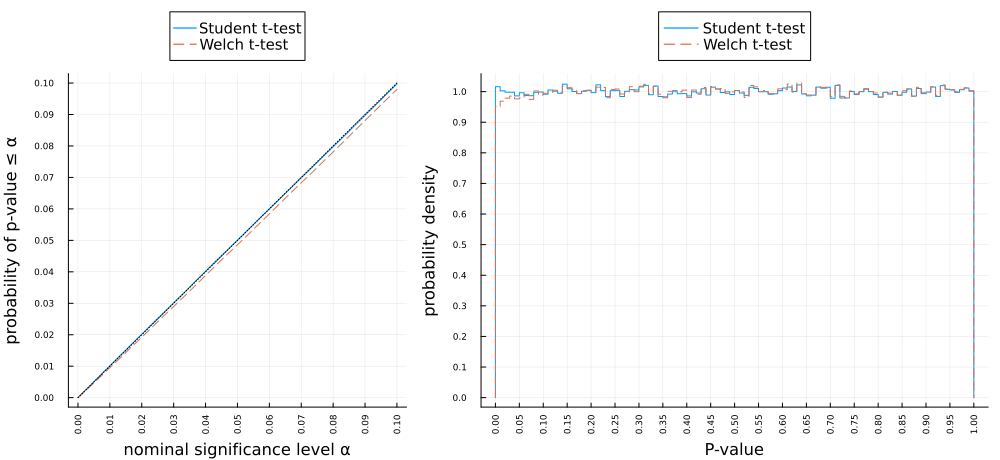

In [2]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 10, n = 10)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 9
(size of sample from Y) = n = 11

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 16.087077911745823
std(DF_Welch) = 1.9244937434081915

ECDF(pval_Student, 0.05) = 0.050151
ECDF(pval_Welch, 0.05) = 0.048886

ECDF(pval_Student, 0.01) = 0.010073
ECDF(pval_Welch, 0.01) = 0.009527



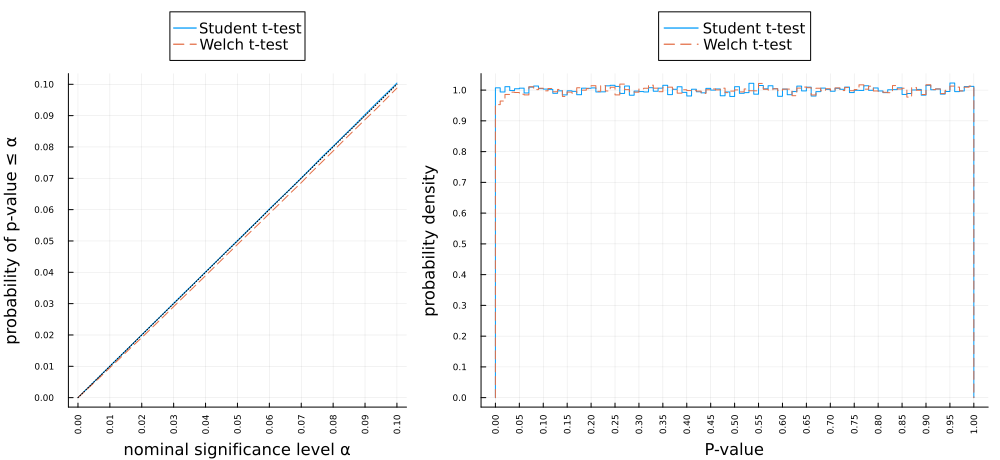

In [3]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 9, n = 11)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 8
(size of sample from Y) = n = 12

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 14.8117058995516
std(DF_Welch) = 2.5797231765001043

ECDF(pval_Student, 0.05) = 0.049522
ECDF(pval_Welch, 0.05) = 0.048759

ECDF(pval_Student, 0.01) = 0.009752
ECDF(pval_Welch, 0.01) = 0.009509



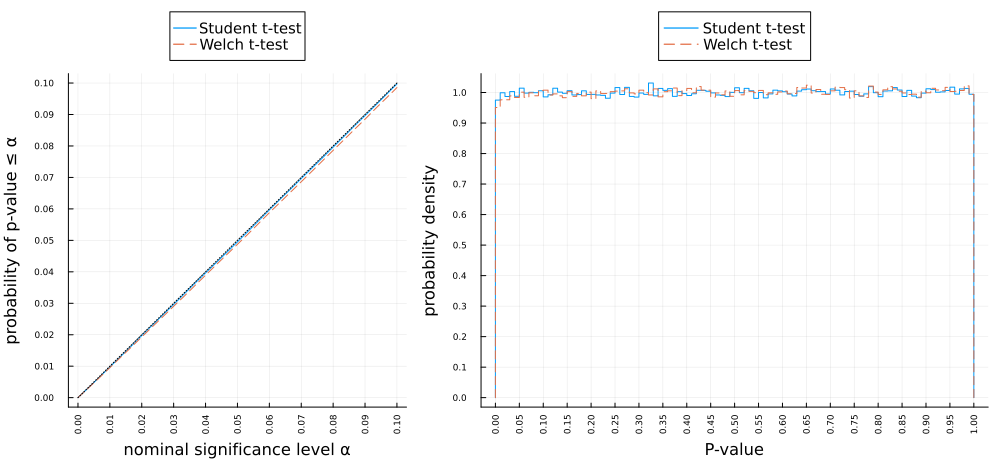

In [4]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 8, n = 12)

(distribution of X) = distx = Normal{Float64}(μ=1.3, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 10

mean(distx) = 1.3
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = true

df_Student = 18
mean(DF_Welch) = 16.53370337788209
std(DF_Welch) = 1.5715581483863146

ECDF(pval_Student, 0.05) = 0.78482
ECDF(pval_Welch, 0.05) = 0.78042

ECDF(pval_Student, 0.01) = 0.525261
ECDF(pval_Welch, 0.01) = 0.513141



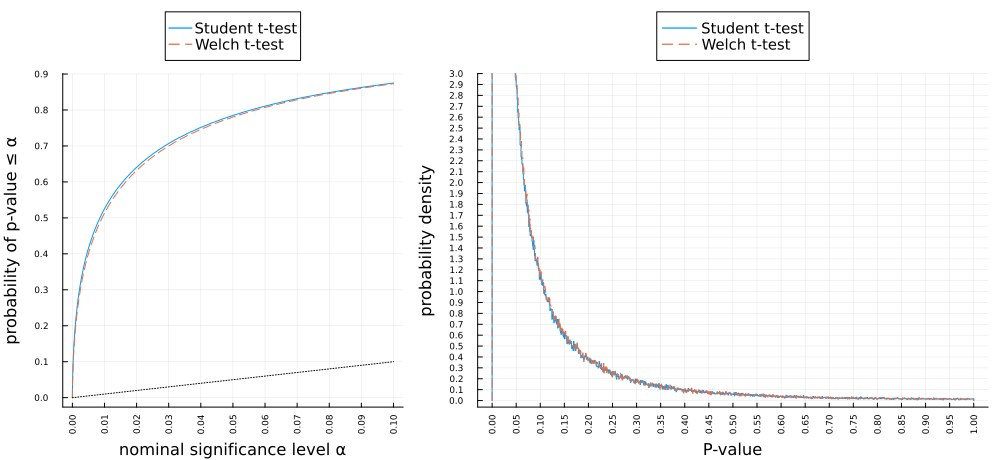

In [5]:
plot_t_tests(; distx = Normal(1.3, 1), disty = Normal(0, 1), m = 10, n = 10,
    ytick=0:0.1:1, ylim=(-0.06, 3))

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 10

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = true

df_Student = 18
mean(DF_Welch) = 13.540976447504567
std(DF_Welch) = 2.2038061901242973

ECDF(pval_Student, 0.05) = 0.054563
ECDF(pval_Welch, 0.05) = 0.050079

ECDF(pval_Student, 0.01) = 0.012224
ECDF(pval_Welch, 0.01) = 0.010276



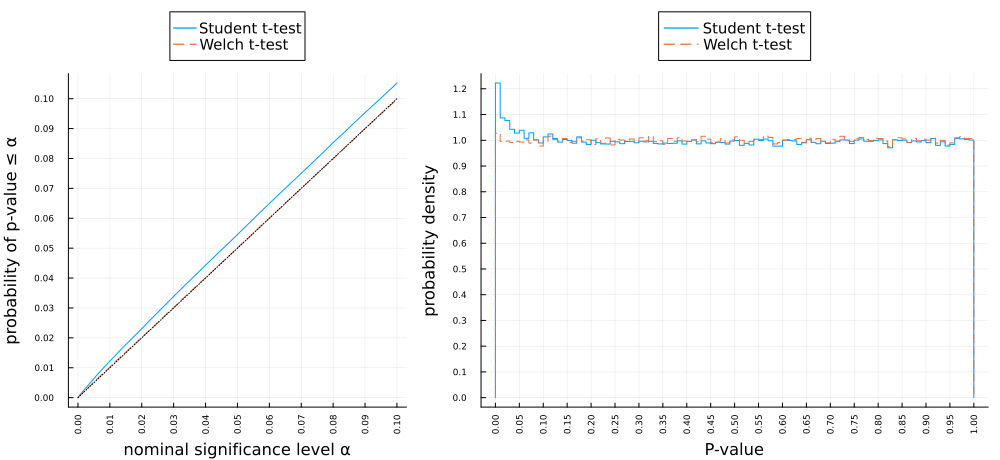

In [6]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 10, n = 10)

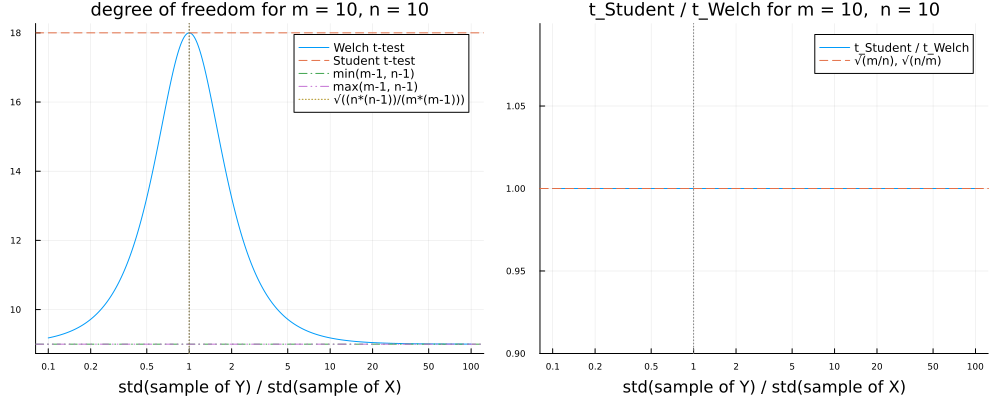

In [7]:
plot_df_and_tstatratio(; m = 10, n = 10)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 9
(size of sample from Y) = n = 11

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 11.811202334674729
std(DF_Welch) = 2.22895714987413

ECDF(pval_Student, 0.05) = 0.069732
ECDF(pval_Welch, 0.05) = 0.050969

ECDF(pval_Student, 0.01) = 0.017714
ECDF(pval_Welch, 0.01) = 0.010815



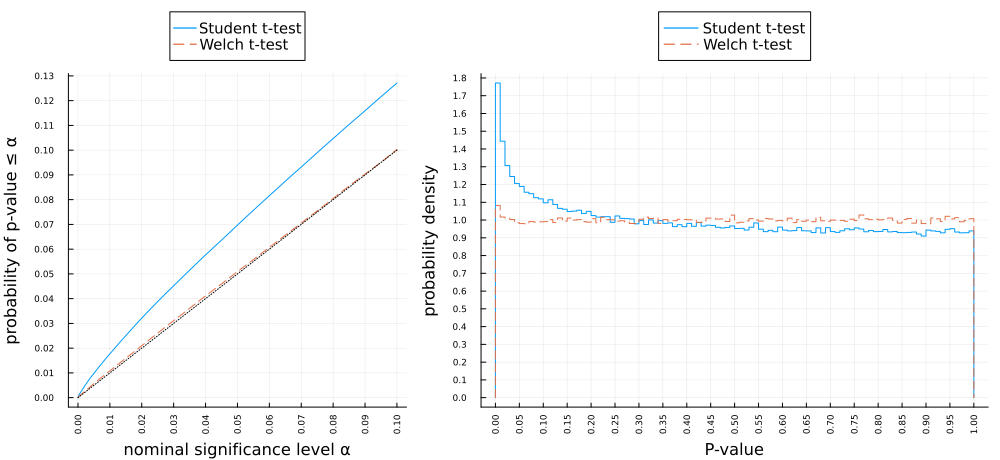

In [8]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 9, n = 11)

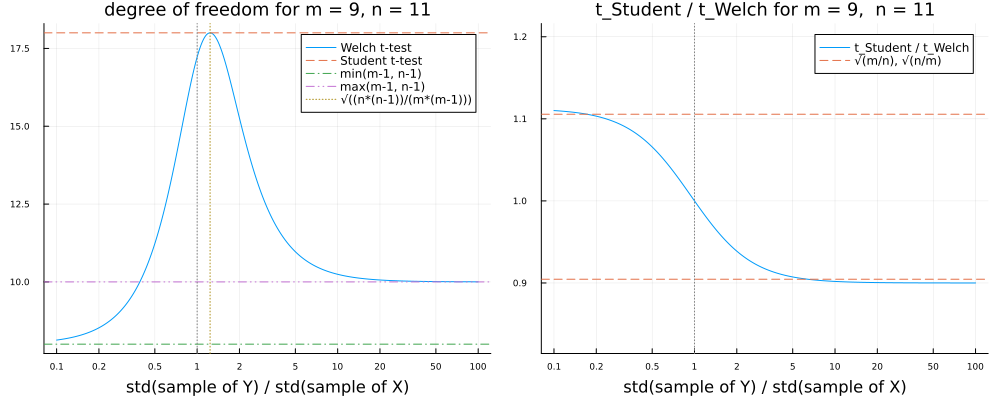

In [9]:
plot_df_and_tstatratio(; m = 9, n = 11)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 8
(size of sample from Y) = n = 12

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 10.045902109837582
std(DF_Welch) = 2.113551879364305

ECDF(pval_Student, 0.05) = 0.087489
ECDF(pval_Welch, 0.05) = 0.051535

ECDF(pval_Student, 0.01) = 0.02486
ECDF(pval_Welch, 0.01) = 0.01126



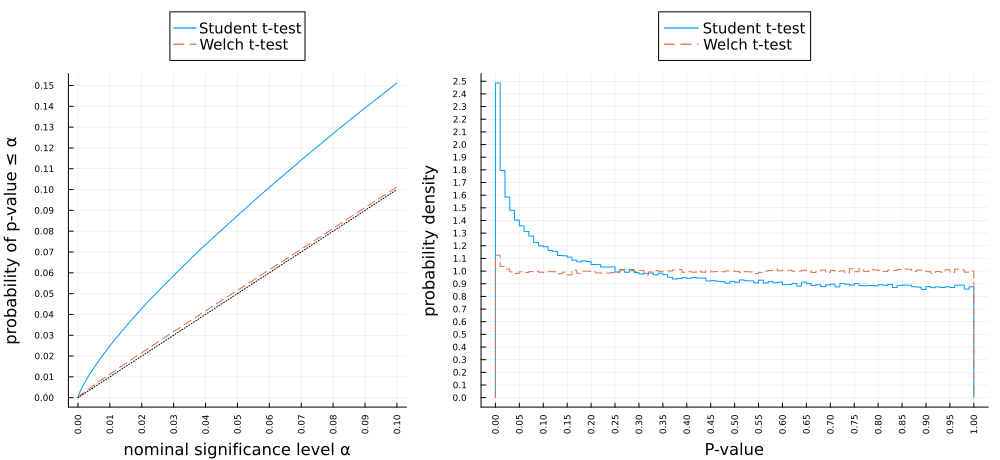

In [10]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 8, n = 12)

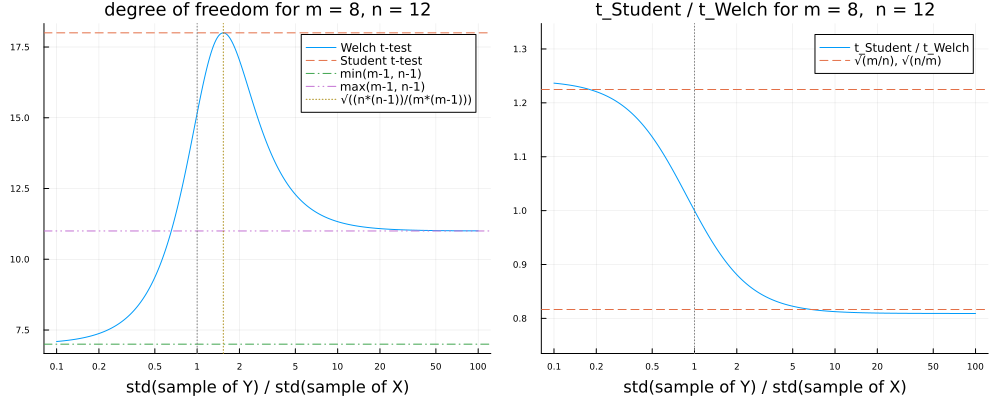

In [11]:
plot_df_and_tstatratio(; m = 8, n = 12)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 80
(size of sample from Y) = n = 120

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 106.23129124047739
std(DF_Welch) = 5.612499039363099

ECDF(pval_Student, 0.05) = 0.082881
ECDF(pval_Welch, 0.05) = 0.049835

ECDF(pval_Student, 0.01) = 0.022815
ECDF(pval_Welch, 0.01) = 0.010053



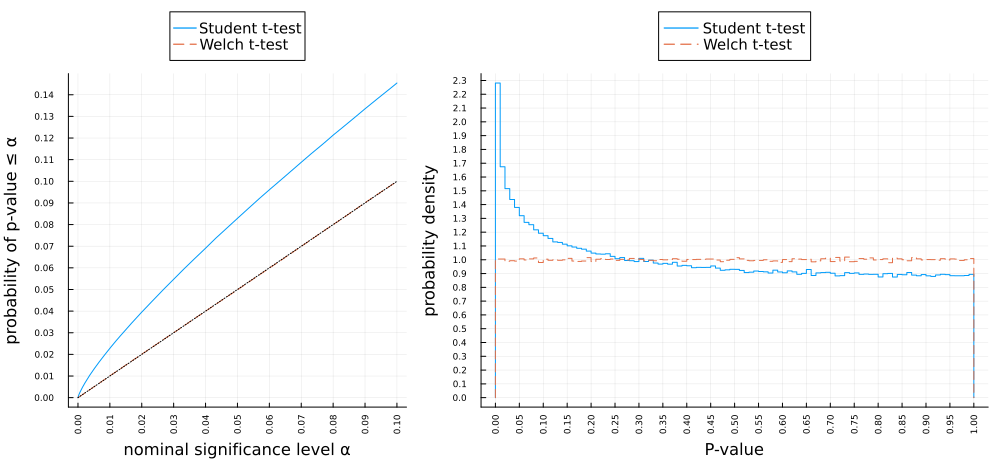

In [12]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 80, n = 120)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 800
(size of sample from Y) = n = 1200

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 1998
mean(DF_Welch) = 1068.36790554552
std(DF_Welch) = 17.297933459236337

ECDF(pval_Student, 0.05) = 0.083
ECDF(pval_Welch, 0.05) = 0.0505

ECDF(pval_Student, 0.01) = 0.02286
ECDF(pval_Welch, 0.01) = 0.01017



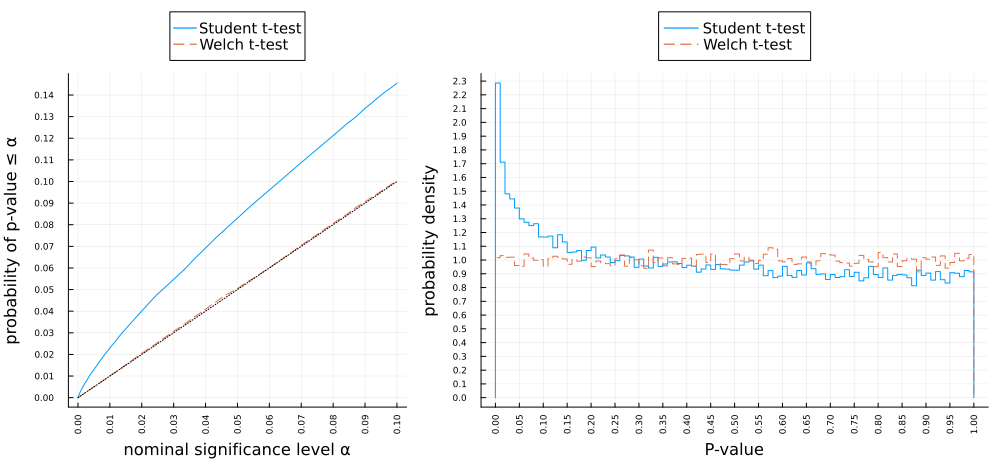

In [13]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 800, n = 1200, L = 10^5, bin=0:0.01:1)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 9
(size of sample from Y) = n = 11

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 9.879157477058746
std(DF_Welch) = 1.4056918790197142

ECDF(pval_Student, 0.05) = 0.081146
ECDF(pval_Welch, 0.05) = 0.051688

ECDF(pval_Student, 0.01) = 0.023478
ECDF(pval_Welch, 0.01) = 0.011383



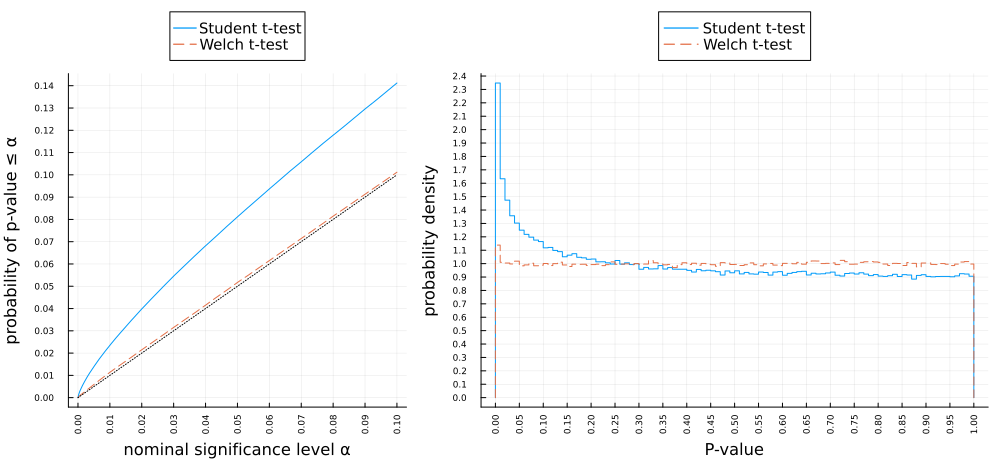

In [14]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 9, n = 11)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 90
(size of sample from Y) = n = 110

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 105.56641356868366
std(DF_Welch) = 3.3802472265932453

ECDF(pval_Student, 0.05) = 0.071492
ECDF(pval_Welch, 0.05) = 0.050153

ECDF(pval_Student, 0.01) = 0.018134
ECDF(pval_Welch, 0.01) = 0.010046



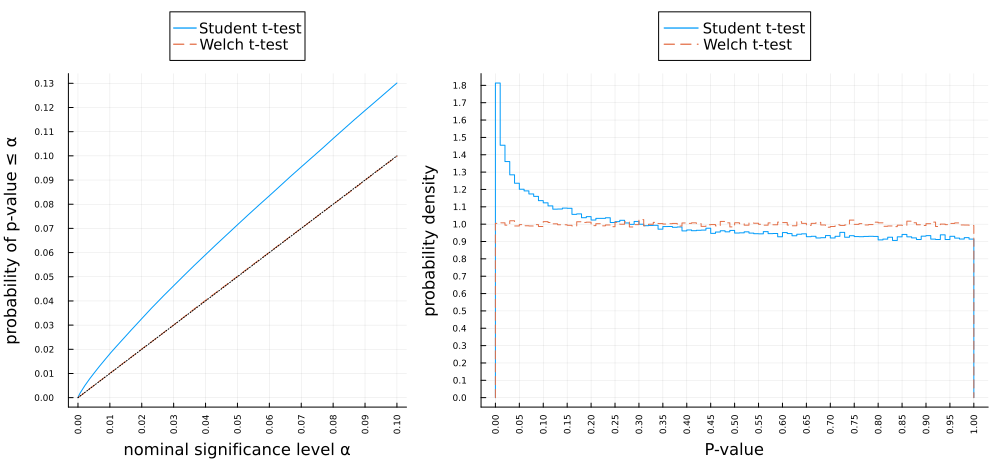

In [15]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 90, n = 110)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 11
(size of sample from Y) = n = 9

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 12.943690129880498
std(DF_Welch) = 1.7138653994926172

ECDF(pval_Student, 0.05) = 0.041237
ECDF(pval_Welch, 0.05) = 0.050345

ECDF(pval_Student, 0.01) = 0.008563
ECDF(pval_Welch, 0.01) = 0.010514



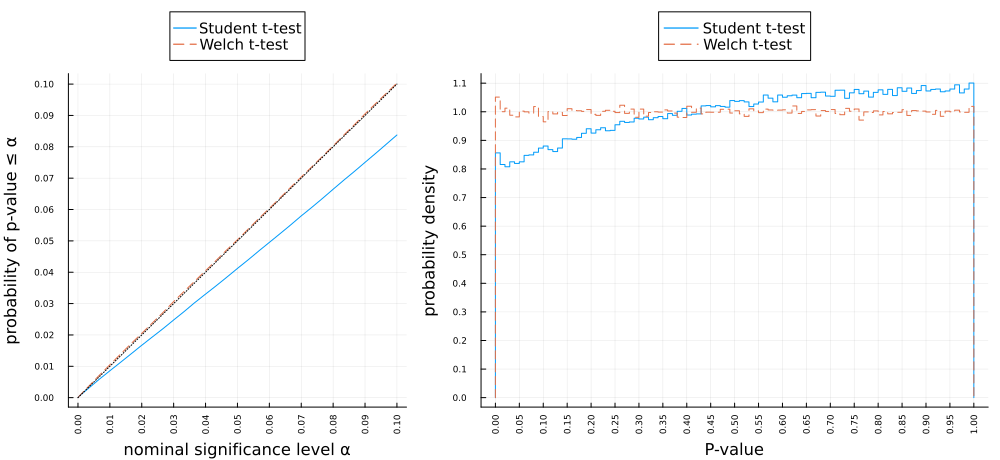

In [16]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 11, n = 9)

(distribution of X) = distx = Normal{Float64}(μ=2.94, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 11
(size of sample from Y) = n = 9

mean(distx) = 2.94
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 12.945784009150332
std(DF_Welch) = 1.7163576787982466

ECDF(pval_Student, 0.05) = 0.769238
ECDF(pval_Welch, 0.05) = 0.801015

ECDF(pval_Student, 0.01) = 0.496918
ECDF(pval_Welch, 0.01) = 0.52889



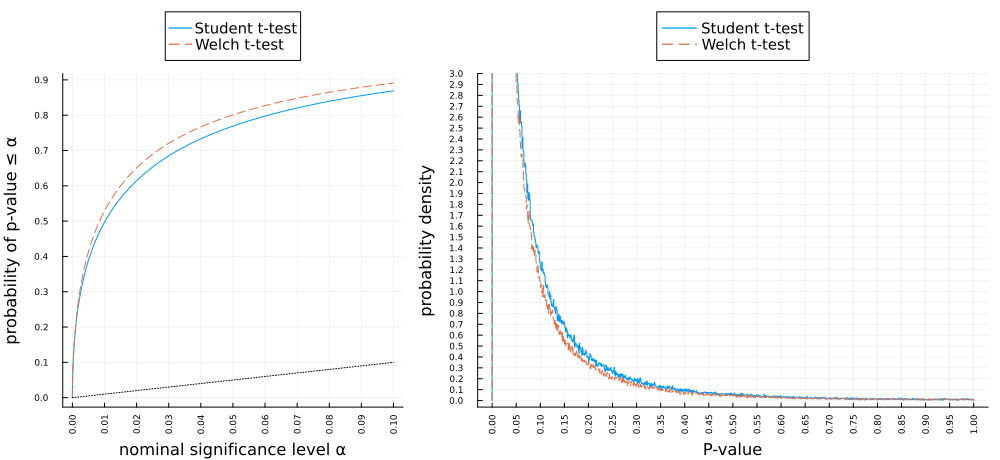

In [17]:
plot_t_tests(; distx = Normal(2.94, 3), disty = Normal(0, 1), m = 11, n = 9,
    ytick=0:0.1:1, ylim=(-0.06, 3))

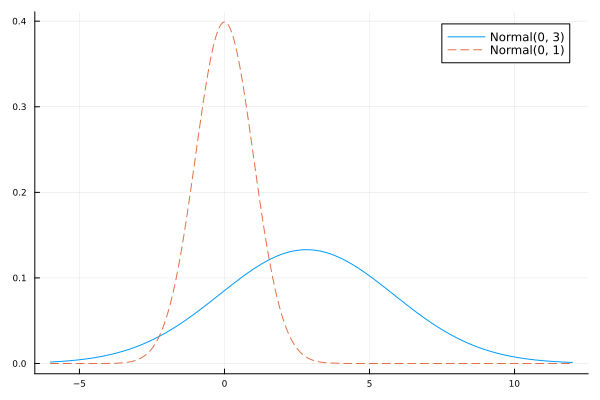

In [18]:
plot(Normal(2.83, 3), -6, 12; label="Normal(0, 3)")
plot!(Normal(0, 1), -6, 12; label="Normal(0, 1)", ls=:dash)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 12
(size of sample from Y) = n = 8

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 14.470522369701486
std(DF_Welch) = 1.72576364538848

ECDF(pval_Student, 0.05) = 0.027248
ECDF(pval_Welch, 0.05) = 0.049721

ECDF(pval_Student, 0.01) = 0.004673
ECDF(pval_Welch, 0.01) = 0.01009



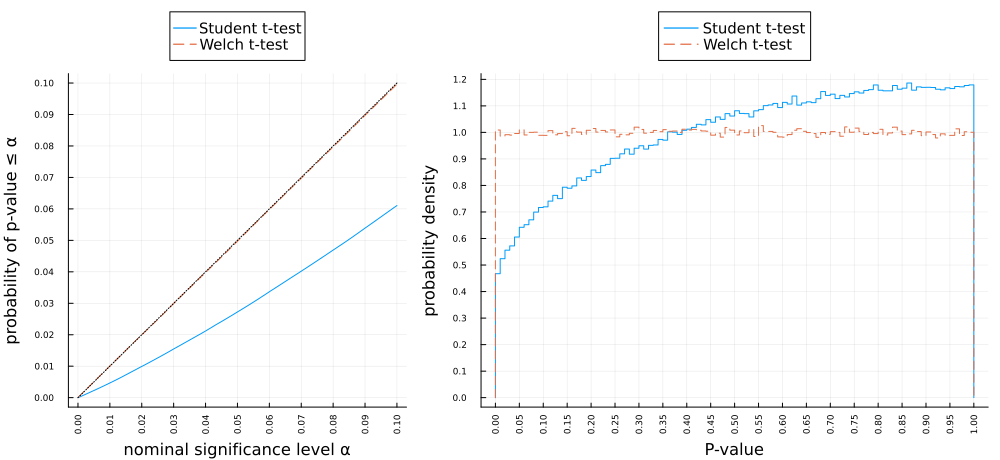

In [19]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 12, n = 8)

(distribution of X) = distx = Normal{Float64}(μ=2.83, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 12
(size of sample from Y) = n = 8

mean(distx) = 2.83
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 14.47417466227338
std(DF_Welch) = 1.725017318670761

ECDF(pval_Student, 0.05) = 0.702301
ECDF(pval_Welch, 0.05) = 0.803156

ECDF(pval_Student, 0.01) = 0.399883
ECDF(pval_Welch, 0.01) = 0.538945



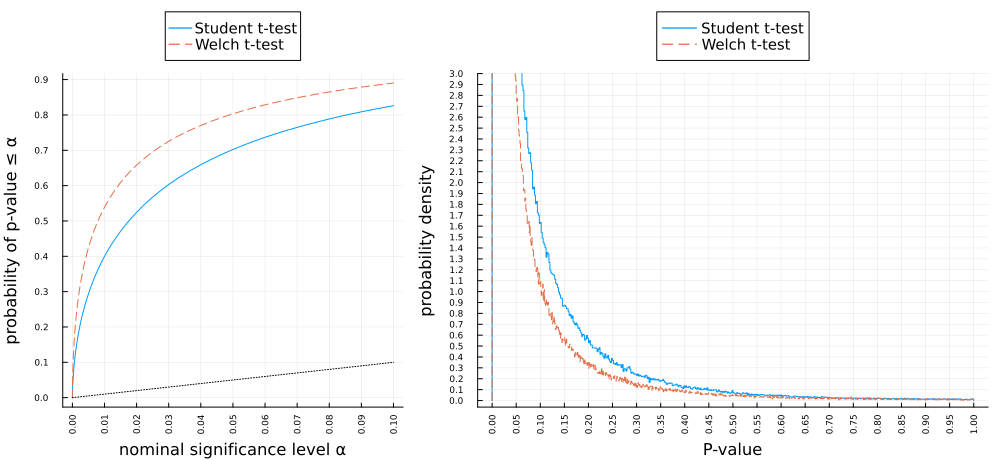

In [20]:
plot_t_tests(; distx = Normal(2.83, 3), disty = Normal(0, 1), m = 12, n = 8,
    ytick=0:0.1:1, ylim=(-0.06, 3))

(distribution of X) = distx = Normal{Float64}(μ=2.83, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 15
(size of sample from Y) = n = 10

mean(distx) = 2.83
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 23
mean(DF_Welch) = 18.428159187671834
std(DF_Welch) = 2.0352969948067265

ECDF(pval_Student, 0.05) = 0.815253
ECDF(pval_Welch, 0.05) = 0.892081

ECDF(pval_Student, 0.01) = 0.542047
ECDF(pval_Welch, 0.01) = 0.689283



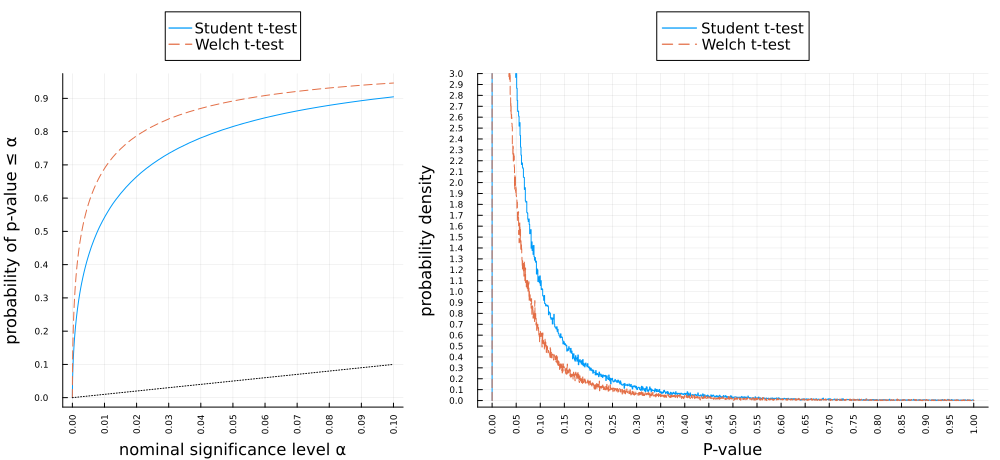

In [21]:
plot_t_tests(; distx = Normal(2.83, 3), disty = Normal(0, 1), m = 15, n = 10,
    ytick=0:0.1:1, ylim=(-0.06, 3))

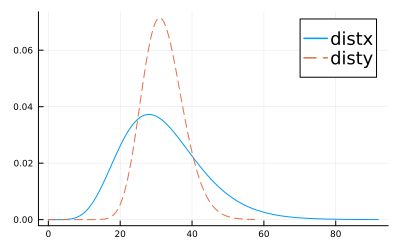

(distribution of X) = distx = Gamma{Float64}(α=8.0, θ=4.0)
(distribution of Y) = disty = Gamma{Float64}(α=32.0, θ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 12

mean(distx) = 32.0
mean(disty) = 32.0
std(distx) = 11.313708498984761
std(disty) = 5.656854249492381

T_Student ≈ T_Welch = false

df_Student = 30
mean(DF_Welch) = 28.02103747124447
std(DF_Welch) = 2.0126518724203954

ECDF(pval_Student, 0.05) = 0.027148
ECDF(pval_Welch, 0.05) = 0.050132

ECDF(pval_Student, 0.01) = 0.004768
ECDF(pval_Welch, 0.01) = 0.010254



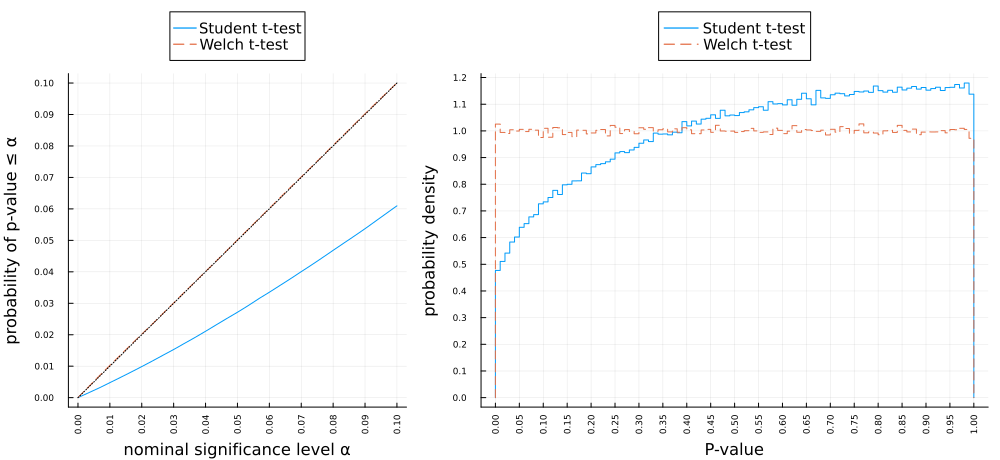

In [22]:
distx = Gamma(8, 4)
disty = Gamma(32, 1)

plot(distx; label="distx")
plot!(disty; label="disty", ls=:dash)
plot!(legendfontsize=12, size=(400, 250)) |> display

plot_t_tests(; distx, disty, m = 20, n = 12)

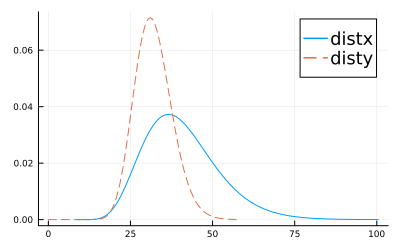

(distribution of X) = distx = LocationScale{Float64, Continuous, Gamma{Float64}}(
μ: 8.6
σ: 1.0
ρ: Gamma{Float64}(α=8.0, θ=4.0)
)

(distribution of Y) = disty = Gamma{Float64}(α=32.0, θ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 12

mean(distx) = 40.6
mean(disty) = 32.0
std(distx) = 11.313708498984761
std(disty) = 5.656854249492381

T_Student ≈ T_Welch = false

df_Student = 30
mean(DF_Welch) = 28.018054538654397
std(DF_Welch) = 2.013321597161829

ECDF(pval_Student, 0.05) = 0.699841
ECDF(pval_Welch, 0.05) = 0.804561

ECDF(pval_Student, 0.01) = 0.369415
ECDF(pval_Welch, 0.01) = 0.547024



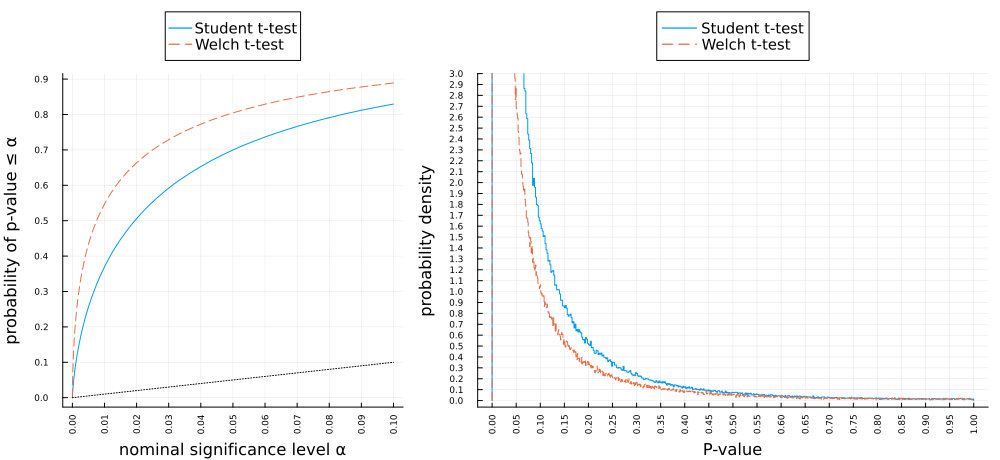

In [23]:
distx = Gamma(8, 4) + 8.6
disty = Gamma(32, 1)

plot(distx; label="distx")
plot!(disty; label="disty", ls=:dash)
plot!(legendfontsize=12, size=(400, 250)) |> display

plot_t_tests(; distx, disty, m = 20, n = 12, ytick=0:0.1:1, ylim=(-0.06, 3))

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.1)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 50

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.1
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 58
mean(DF_Welch) = 13.181532727360157
std(DF_Welch) = 3.005072998838781

ECDF(pval_Student, 0.05) = 0.065841
ECDF(pval_Welch, 0.05) = 0.051719

ECDF(pval_Student, 0.01) = 0.015541
ECDF(pval_Welch, 0.01) = 0.011335



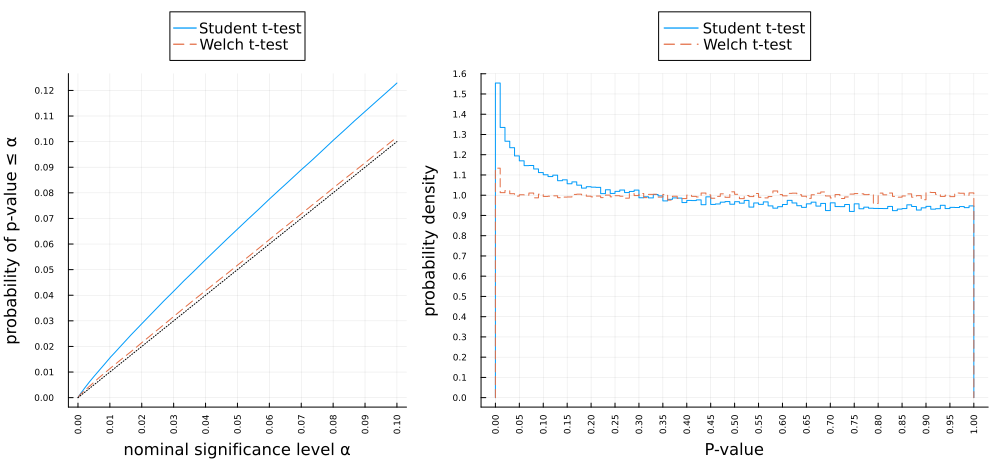

In [24]:
plot_t_tests(; distx = Normal(0, 1.1), disty = Normal(0, 1), m = 10, n = 50)

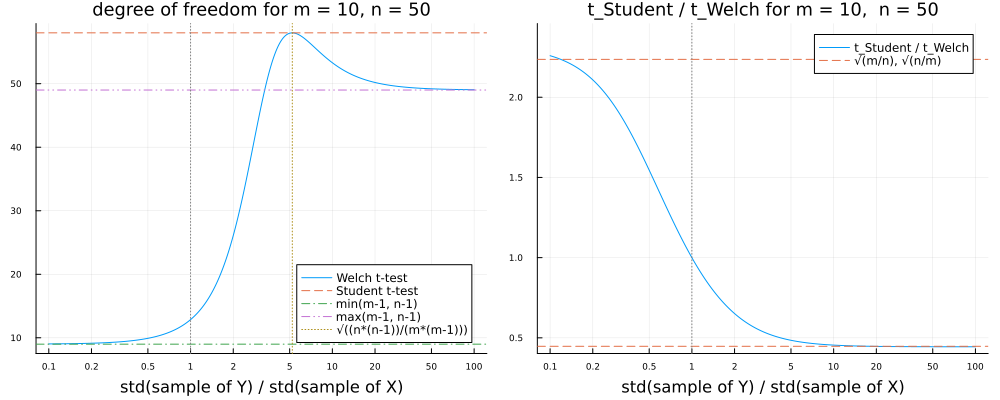

In [25]:
plot_df_and_tstatratio(; m = 10, n = 50)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.1)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 100

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.1
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 118
mean(DF_Welch) = 26.54776265238472
std(DF_Welch) = 3.1974989769801128

ECDF(pval_Student, 0.05) = 0.065601
ECDF(pval_Welch, 0.05) = 0.050128

ECDF(pval_Student, 0.01) = 0.015552
ECDF(pval_Welch, 0.01) = 0.010319



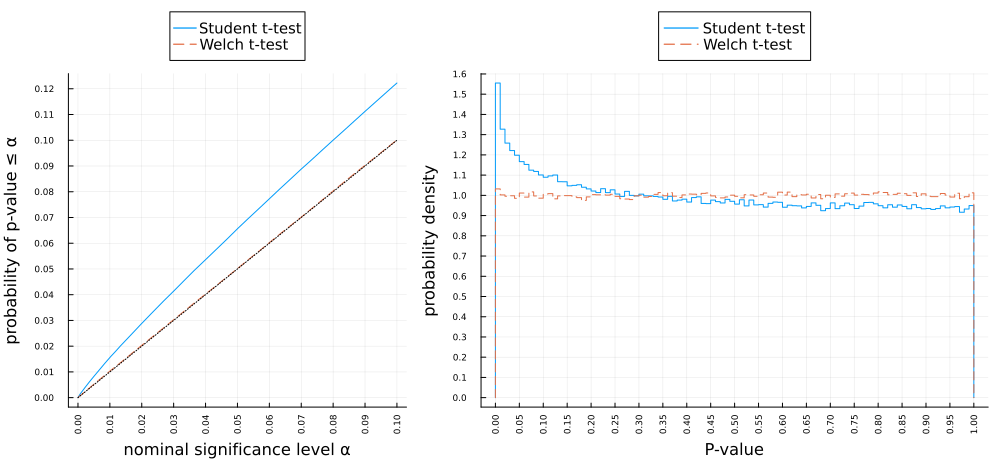

In [26]:
plot_t_tests(; distx = Normal(0, 1.1), disty = Normal(0, 1), m = 20, n = 100)

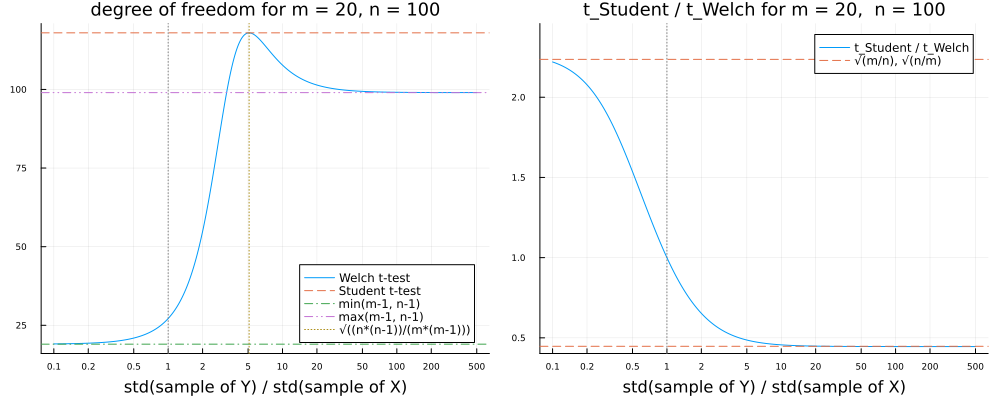

In [27]:
plot_df_and_tstatratio(; m = 20, n = 100,
    tick = Any[0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500])

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.2)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 30

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 38
mean(DF_Welch) = 14.671364915913902
std(DF_Welch) = 3.669877874683026

ECDF(pval_Student, 0.05) = 0.072484
ECDF(pval_Welch, 0.05) = 0.050883

ECDF(pval_Student, 0.01) = 0.01812
ECDF(pval_Welch, 0.01) = 0.011089



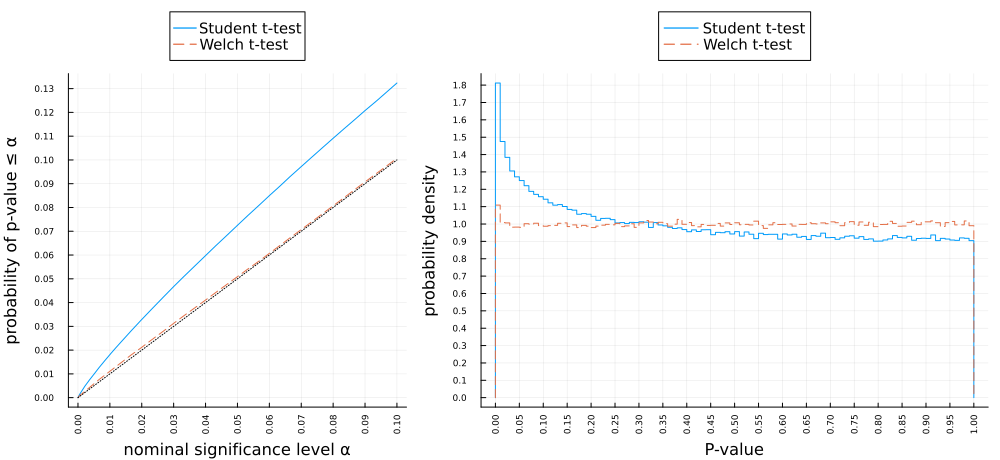

In [28]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 10, n = 30)

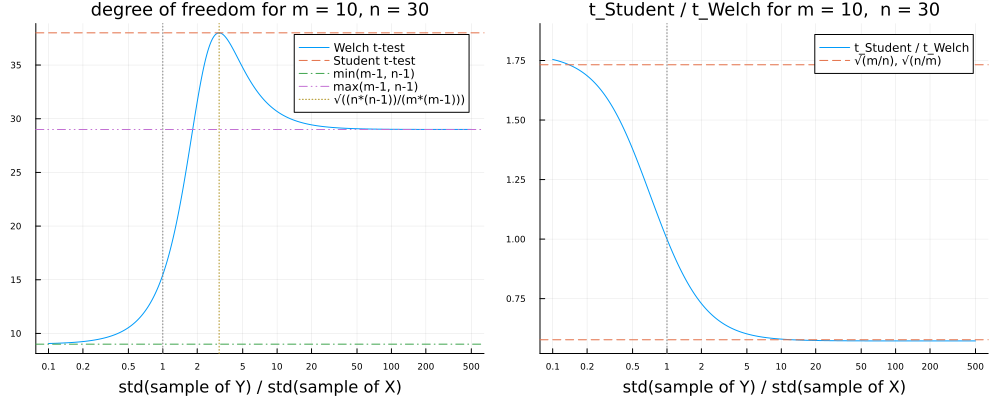

In [29]:
plot_df_and_tstatratio(; m = 10, n = 30,
    tick = Any[0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500])

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.2)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 60

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 78
mean(DF_Welch) = 29.46974002830756
std(DF_Welch) = 4.423100262849748

ECDF(pval_Student, 0.05) = 0.073017
ECDF(pval_Welch, 0.05) = 0.050089

ECDF(pval_Student, 0.01) = 0.018222
ECDF(pval_Welch, 0.01) = 0.010102



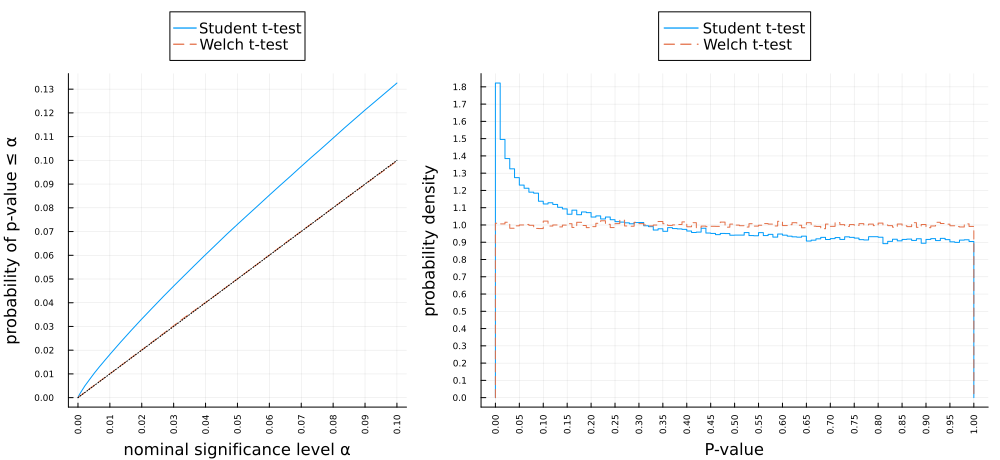

In [30]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 20, n = 60)

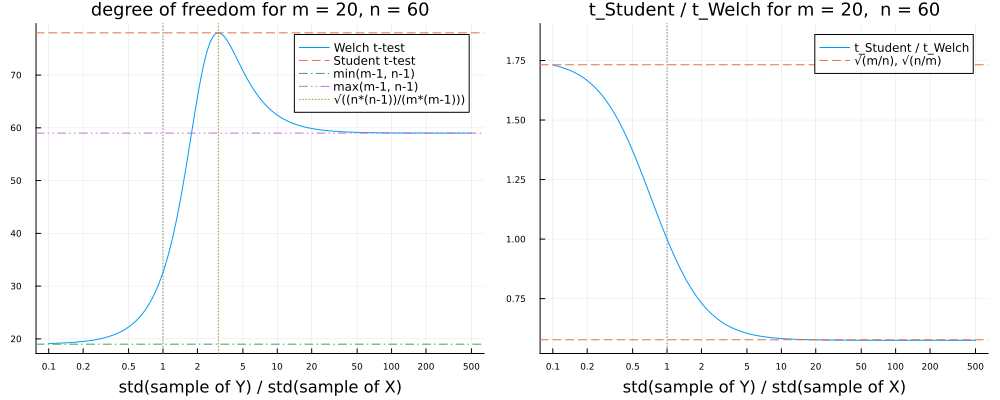

In [31]:
plot_df_and_tstatratio(; m = 20, n = 60,
    tick = Any[0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500])

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.2)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 60

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 78
mean(DF_Welch) = 29.472931882924367
std(DF_Welch) = 4.4222231945700985

ECDF(pval_Student, 0.05) = 0.073116
ECDF(pval_Welch, 0.05) = 0.050095

ECDF(pval_Student, 0.01) = 0.018447
ECDF(pval_Welch, 0.01) = 0.010291



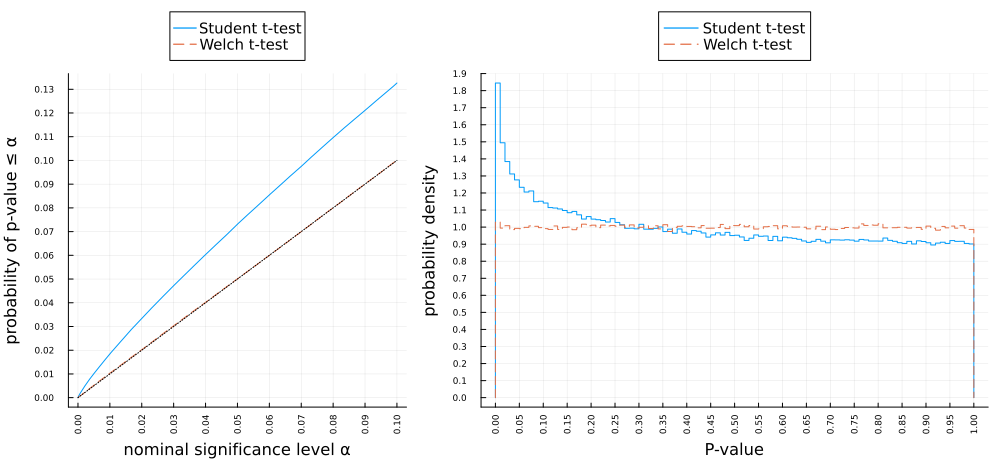

In [32]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 20, n = 60)

(distribution of X) = distx = Gamma{Float64}(α=1.0, θ=4.0)
(distribution of Y) = disty = Gamma{Float64}(α=4.0, θ=1.0)
(size of sample from X) = m = 100
(size of sample from Y) = n = 100

mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0

T_Student ≈ T_Welch = true

df_Student = 198
mean(DF_Welch) = 147.718925292045
std(DF_Welch) = 13.528654483183706

ECDF(pval_Student, 0.05) = 0.053533
ECDF(pval_Welch, 0.05) = 0.05308

ECDF(pval_Student, 0.01) = 0.012711
ECDF(pval_Welch, 0.01) = 0.012507



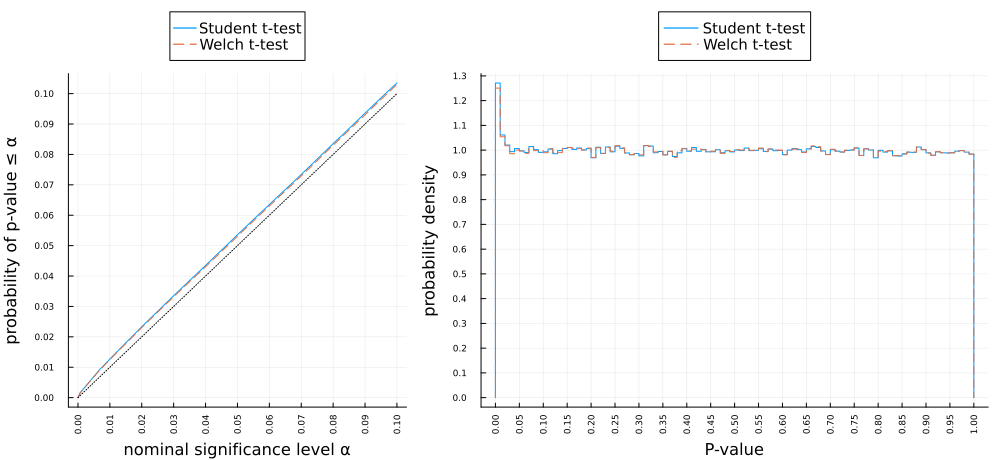

In [33]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 100, n = 100)

(distribution of X) = distx = Gamma{Float64}(α=1.0, θ=4.0)
(distribution of Y) = disty = Gamma{Float64}(α=4.0, θ=1.0)
(size of sample from X) = m = 90
(size of sample from Y) = n = 110

mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 127.39677306783807
std(DF_Welch) = 12.158836599187149

ECDF(pval_Student, 0.05) = 0.068405
ECDF(pval_Welch, 0.05) = 0.054258

ECDF(pval_Student, 0.01) = 0.018393
ECDF(pval_Welch, 0.01) = 0.013674



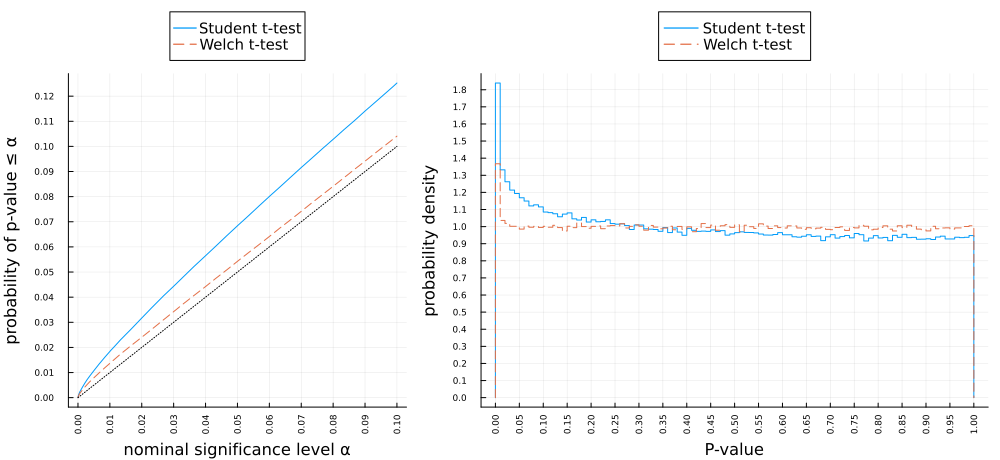

In [34]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 90, n = 110)

(distribution of X) = distx = Gamma{Float64}(α=1.0, θ=4.0)
(distribution of Y) = disty = Gamma{Float64}(α=4.0, θ=1.0)
(size of sample from X) = m = 80
(size of sample from Y) = n = 120

mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 108.0316305834592
std(DF_Welch) = 10.129725649749071

ECDF(pval_Student, 0.05) = 0.085899
ECDF(pval_Welch, 0.05) = 0.056022

ECDF(pval_Student, 0.01) = 0.025524
ECDF(pval_Welch, 0.01) = 0.014829



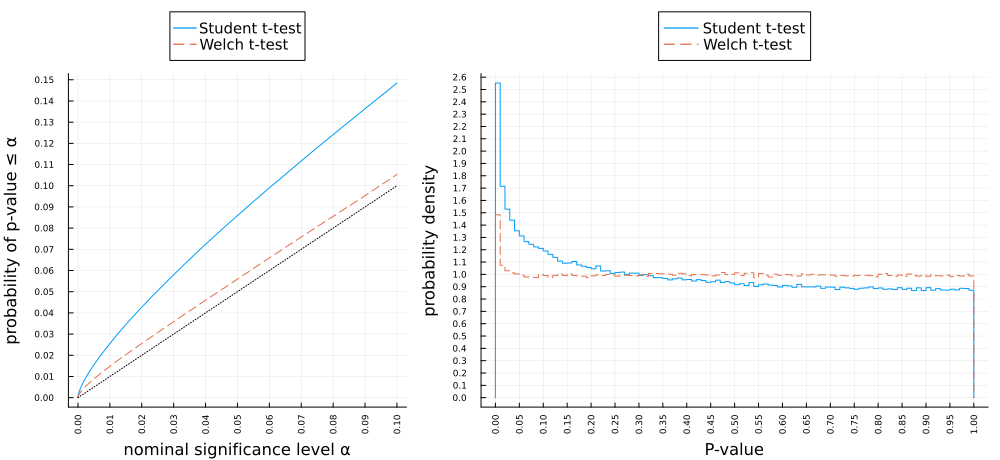

In [35]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 80, n = 120)

(distribution of X) = distx = LogNormal{Float64}(μ=0.1, σ=0.7)
(distribution of Y) = disty = LogNormal{Float64}(μ=0.2, σ=0.7)
(size of sample from X) = m = 1000
(size of sample from Y) = n = 1000

mean(distx) = 1.411989919667659
mean(disty) = 1.5604901958326667
std(distx) = 1.1227905724784957
std(disty) = 1.2408754877927413

T_Student ≈ T_Welch = true

df_Student = 1998
mean(DF_Welch) = 1962.6451039451388
std(DF_Welch) = 41.026926737106514

ECDF(pval_Student, 0.05) = 0.80298
ECDF(pval_Welch, 0.05) = 0.80298

ECDF(pval_Student, 0.01) = 0.59265
ECDF(pval_Welch, 0.01) = 0.59263



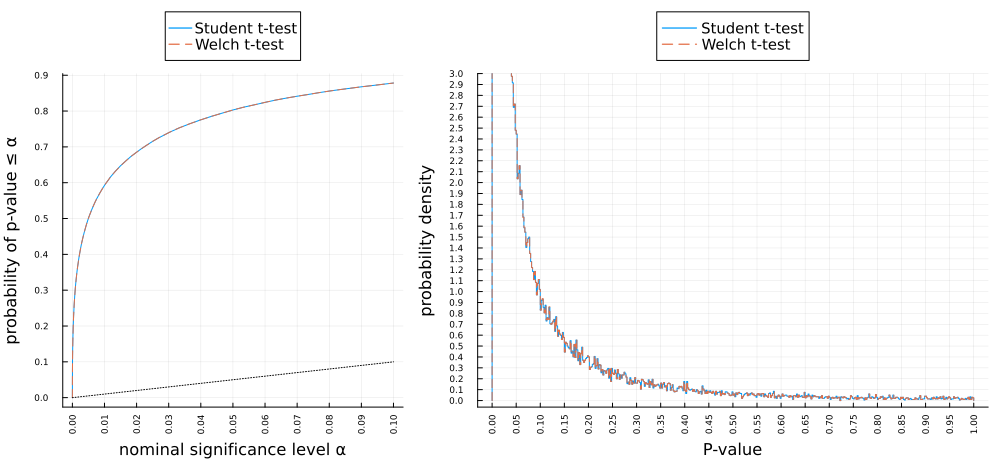

In [36]:
distx = LogNormal(0.1, 0.7)
disty = LogNormal(0.2, 0.7)
plot_t_tests(; distx, disty, m = 10^3, n = 10^3, L = 10^5, ytick=0:0.1:1, ylim=(-0.06, 3))

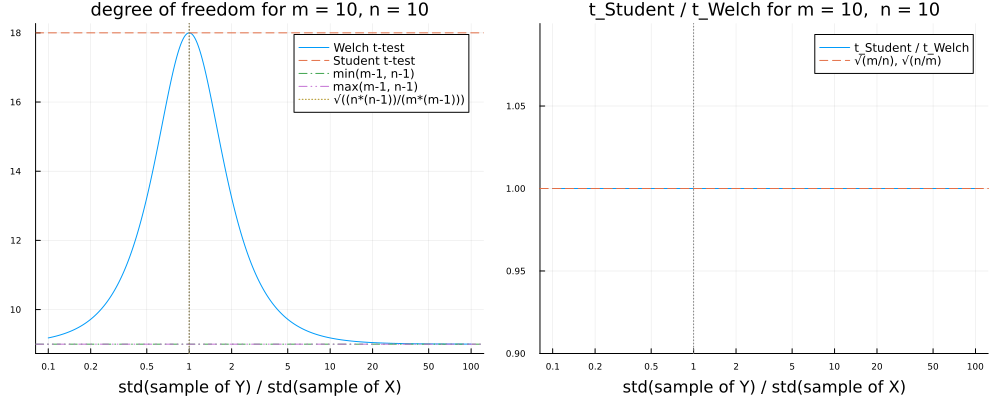

In [37]:
plot_df_and_tstatratio(; m=10, n=10)

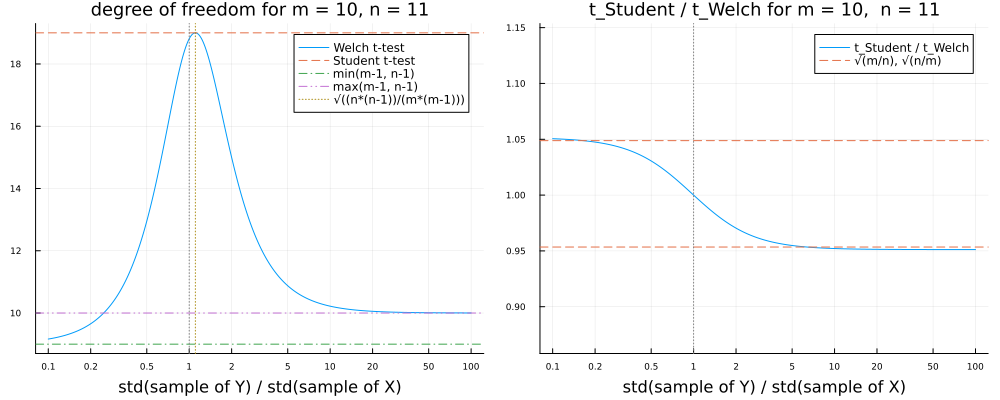

In [38]:
plot_df_and_tstatratio(; m=10, n=11)

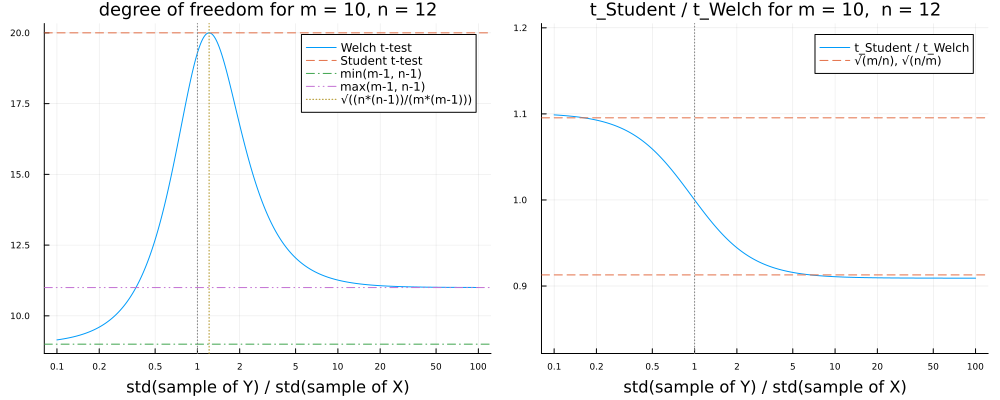

In [39]:
plot_df_and_tstatratio(; m=10, n=12)

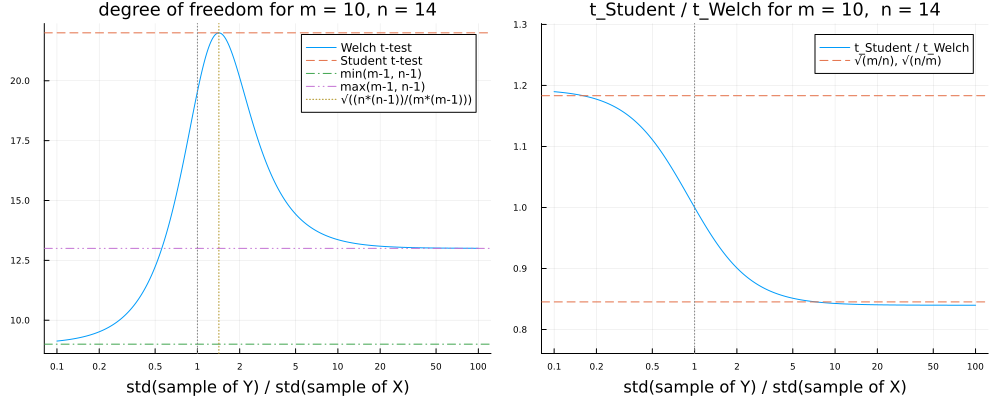

In [40]:
plot_df_and_tstatratio(; m=10, n=14)

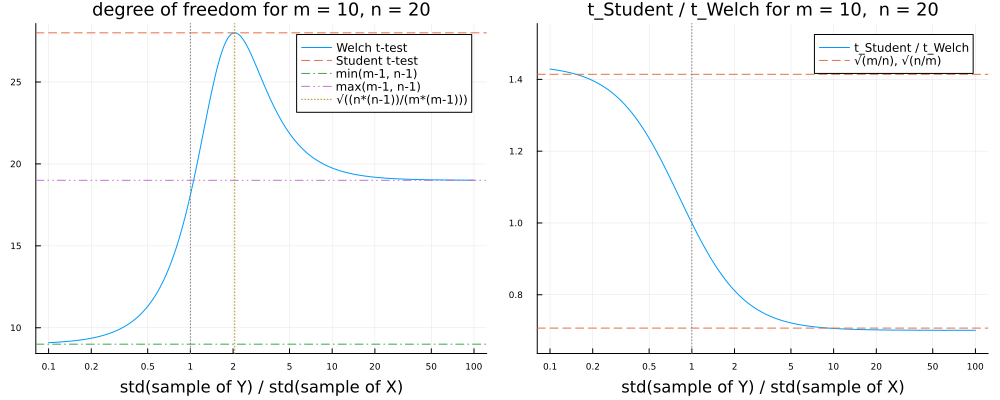

In [41]:
plot_df_and_tstatratio(; m=10, n=20)

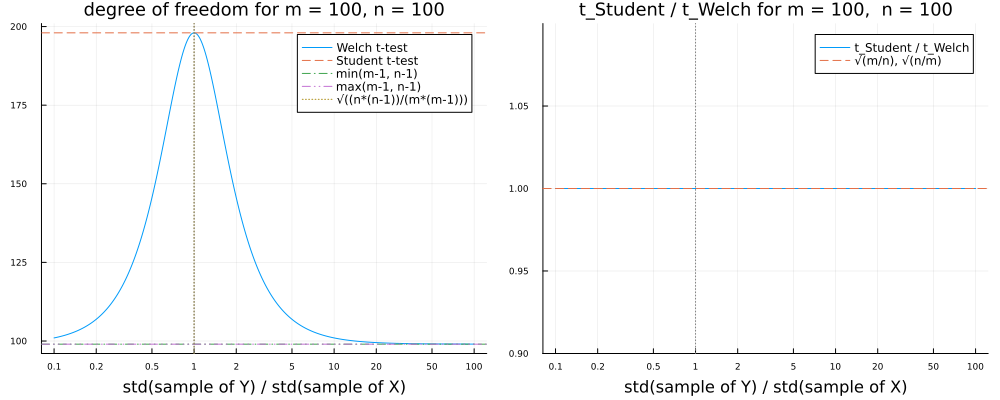

In [42]:
plot_df_and_tstatratio(; m=100, n=100)

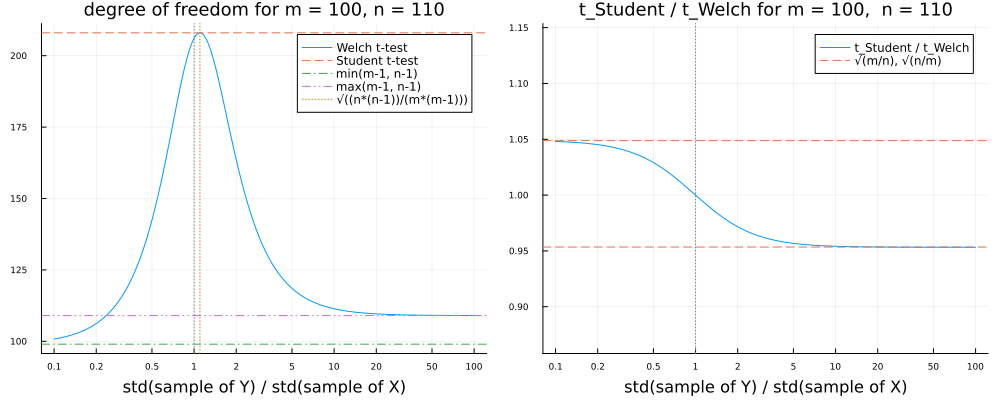

In [43]:
plot_df_and_tstatratio(; m=100, n=110)

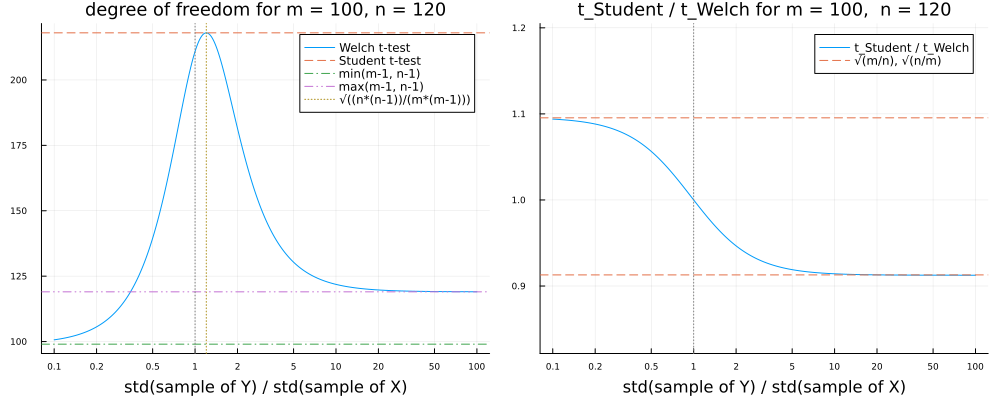

In [44]:
plot_df_and_tstatratio(; m=100, n=120)

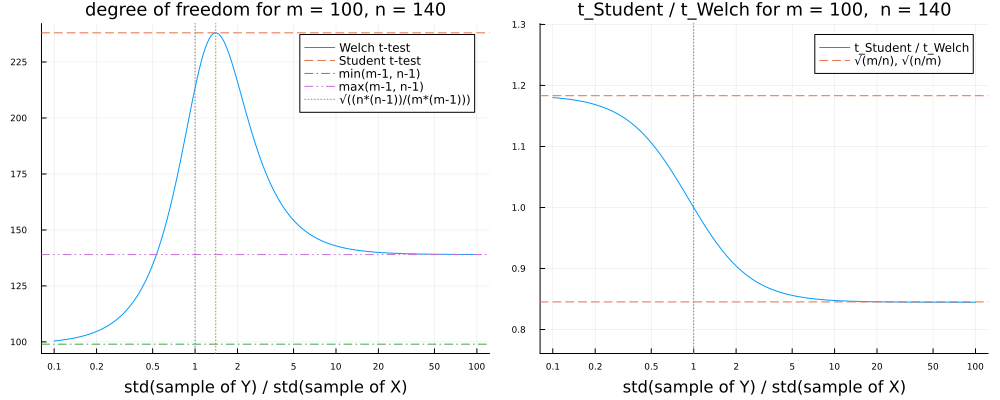

In [45]:
plot_df_and_tstatratio(; m=100, n=140)

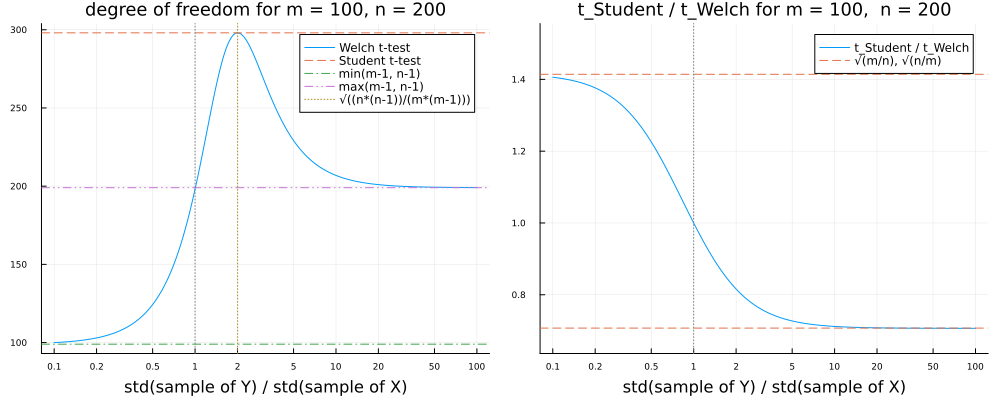

In [46]:
plot_df_and_tstatratio(; m=100, n=200)

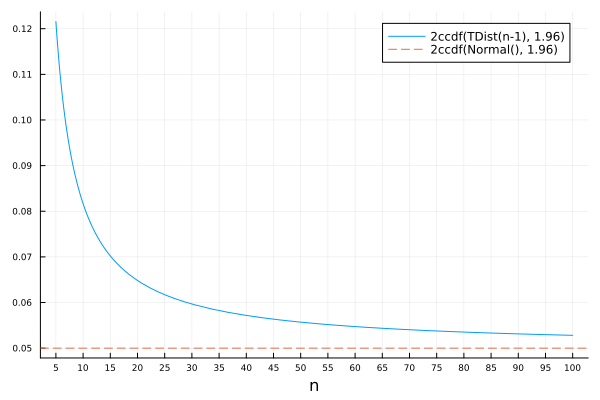

In [47]:
z = 1.96
plot(n -> 2ccdf(TDist(n-1), z), 5, 100; label="2ccdf(TDist(n-1), $z)")
hline!([2ccdf(Normal(), z)]; label="2ccdf(Normal(), $z)", ls=:dash)
plot!(xguide="n")
plot!(xtick=0:5:100, ytick=0:0.01:1)

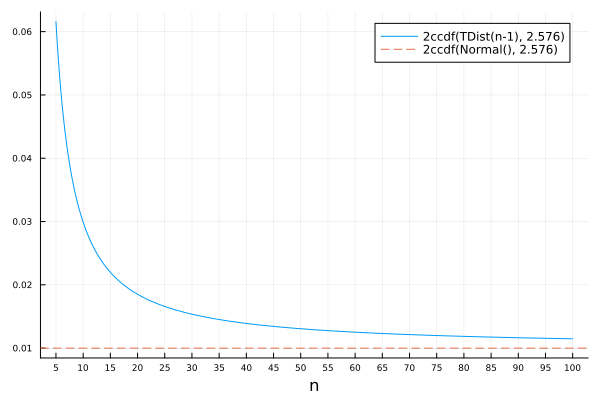

In [48]:
z = 2.576
plot(n -> 2ccdf(TDist(n-1), z), 5, 100; label="2ccdf(TDist(n-1), $z)")
hline!([2ccdf(Normal(), z)]; label="2ccdf(Normal(), $z)", ls=:dash)
plot!(xguide="n")
plot!(xtick=0:5:100, ytick=0:0.01:1)

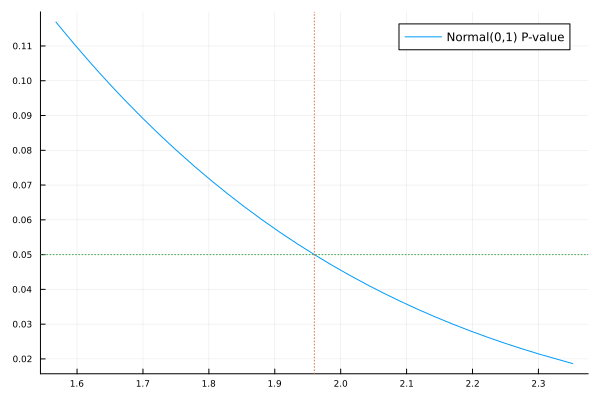

In [49]:
z = 1.96
plot(x -> 2ccdf(Normal(0,1), x), 0.8z, 1.2z; label="Normal(0,1) P-value")
plot!(xtick=0:0.1:4, ytick=0:0.01:1)
vline!([z]; label="", ls=:dot)
hline!([2ccdf(Normal(), z)]; label="", ls=:dot)

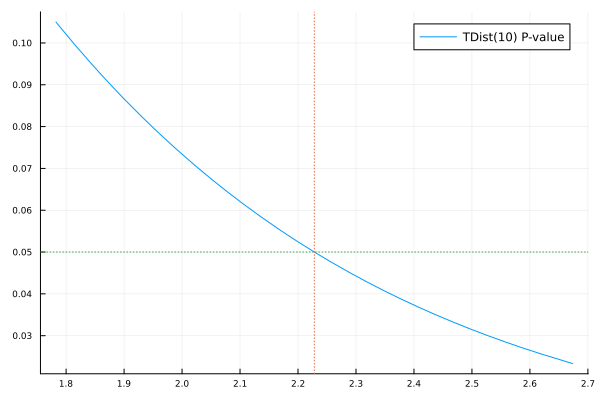

In [50]:
dist = TDist(10)
z = cquantile(dist, 0.05/2)
plot(x -> 2ccdf(dist, x), 0.8z, 1.2z; label="TDist(10) P-value")
plot!(xtick=0:0.1:4, ytick=0:0.01:1)
vline!([z]; label="", ls=:dot)
hline!([2ccdf(dist, z)]; label="", ls=:dot)